In [ ]:
!pip install keras tensorflow opencv-python

In [2]:
import glob, os

import matplotlib.pyplot as plt
import numpy as np
import random, cv2

In [3]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

characters = "23456789abcdefghijkmnpqrstuvwxyzABCDEFGHIJKLMNPQRSTUVWXYZ"
print(characters)

23456789abcdefghijkmnpqrstuvwxyzABCDEFGHIJKLMNPQRSTUVWXYZ


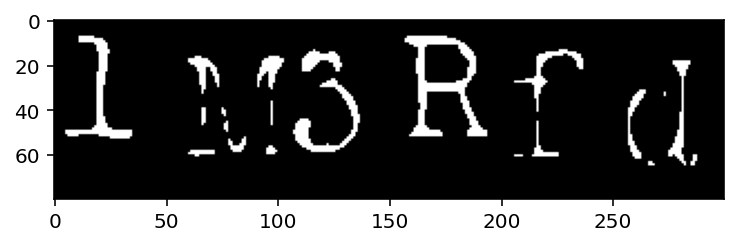

In [4]:
from PIL import ImageFont, ImageDraw, Image

cur_path = 'kaggle/input' if 'kaggle' in os.getcwd() else '.'
fonts = [ImageFont.truetype(font_path, 60) for font_path in glob.glob(os.path.join('font-file/*.otf'))]

def generateCaptchaImg(text: str, height: int = 80, width: int = 300):
    img = np.zeros((height, width), np.uint8)
    img[:] = 0

    imgPil = Image.fromarray(img)
    font = random.choice(fonts)
    for index, char in enumerate(text):
        x = index * 50 + 5 + random.randint(-2, 2)
        y = random.randint(0, 20)
        draw = ImageDraw.Draw(imgPil)
        draw.text((x, y),  char, font = font, fill = 255)
        
    img = np.array(imgPil)
    _, img = cv2.threshold(img, 125, 255, cv2.THRESH_BINARY)
    return img

img = generateCaptchaImg('1M3Rfd')
plt.imshow(img, cmap='gray')

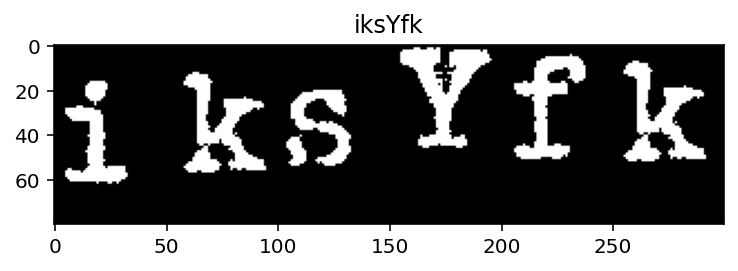

In [5]:
width, height, n_len, n_class = 300, 80, 6, len(characters)

random_str = ''.join([random.choice(characters) for j in range(n_len)])
img = generateCaptchaImg(random_str, height, width)

plt.title(random_str)
plt.imshow(img, cmap = 'gray')

text: DLI8mL
x shape: (80, 300) , y shape: (1, 57)


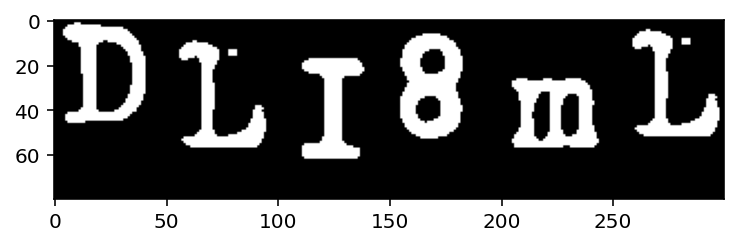

In [6]:
def gen(batch_size=32):
    X = np.zeros((batch_size, height, width), dtype=np.uint8)
    y = [np.zeros((batch_size, n_class), dtype=np.uint8) for i in range(n_len)]
    while True:
        for i in range(batch_size):
            random_str = ''.join([random.choice(characters) for j in range(n_len)])
            X[i] = generateCaptchaImg(random_str, height, width)
            for j, ch in enumerate(random_str):
                y[j][i, :] = 0
                y[j][i, characters.find(ch)] = 1
        yield X, y
        
def decode(y):
    y = np.argmax(np.array(y), axis=2)[:,0]
    return ''.join([characters[x] for x in y])

X, y = next(gen(1))
print('text:', decode(y))
print('x shape:', X[0].shape, ', y shape:', y[0].shape)
plt.imshow(X[0], cmap='gray')

In [7]:
from keras.models import *
from keras.layers import *
import tensorflow as tf


input_tensor = Input((height, width, 1))

x = input_tensor
for i in range(4):
    x = Conv2D(filters = 32 * (2 ** i), kernel_size = (3, 3), padding = 'same', activation = 'relu')(x)
    x = Conv2D(filters = 32 * (2 ** i), kernel_size = (3, 3), padding = 'same', activation = 'relu')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D(pool_size = (2, 2))(x)
    if i < 3:
        x = Dropout(0.5)(x)
x = Flatten()(x)
x = Dropout(0.5)(x)
x = [Dense(n_class, activation = 'softmax', name = 'c{}'.format(i + 1))(x) for i in range(n_len)]

model = Model(inputs = input_tensor, outputs = x)
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [8]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 80, 300, 1)] 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 80, 300, 32)  320         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 80, 300, 32)  9248        conv2d[0][0]                     
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 80, 300, 32)  128         conv2d_1[0][0]                   
______________________________________________________________________________________________

In [9]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  0


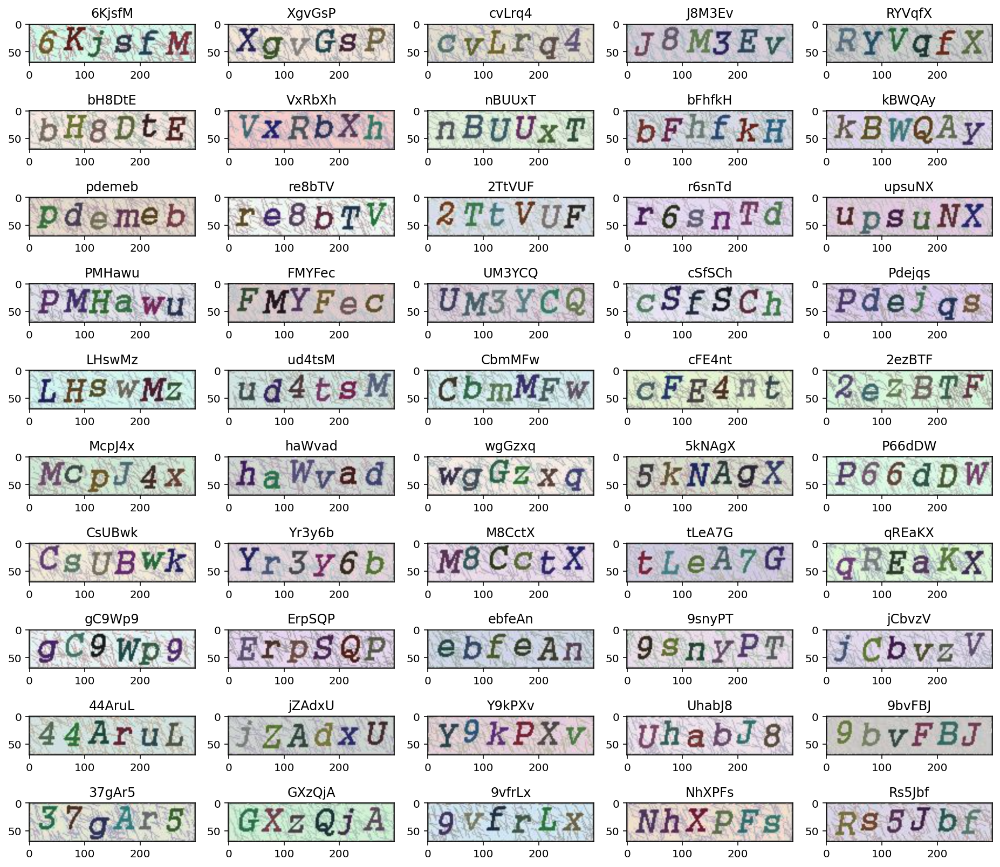

In [10]:
import glob, cv2
import matplotlib.pyplot as plt

img_paths = glob.glob(os.path.join(cur_path, 'captcha-testset/*.png'))

texts, imgs = [], []
for path in img_paths:
    text = path.split('/')[-1].replace('.png','')
    img = cv2.imread(path)
    
    texts.append(text)
    imgs.append(img)
    
fig = plt.figure(figsize=(16, 16))
for index, (text, img) in enumerate(zip(texts, imgs)):
    plt.subplot(len(imgs) // 5 + 1, 5, index + 1)
    plt.imshow(img)
    plt.title(text)

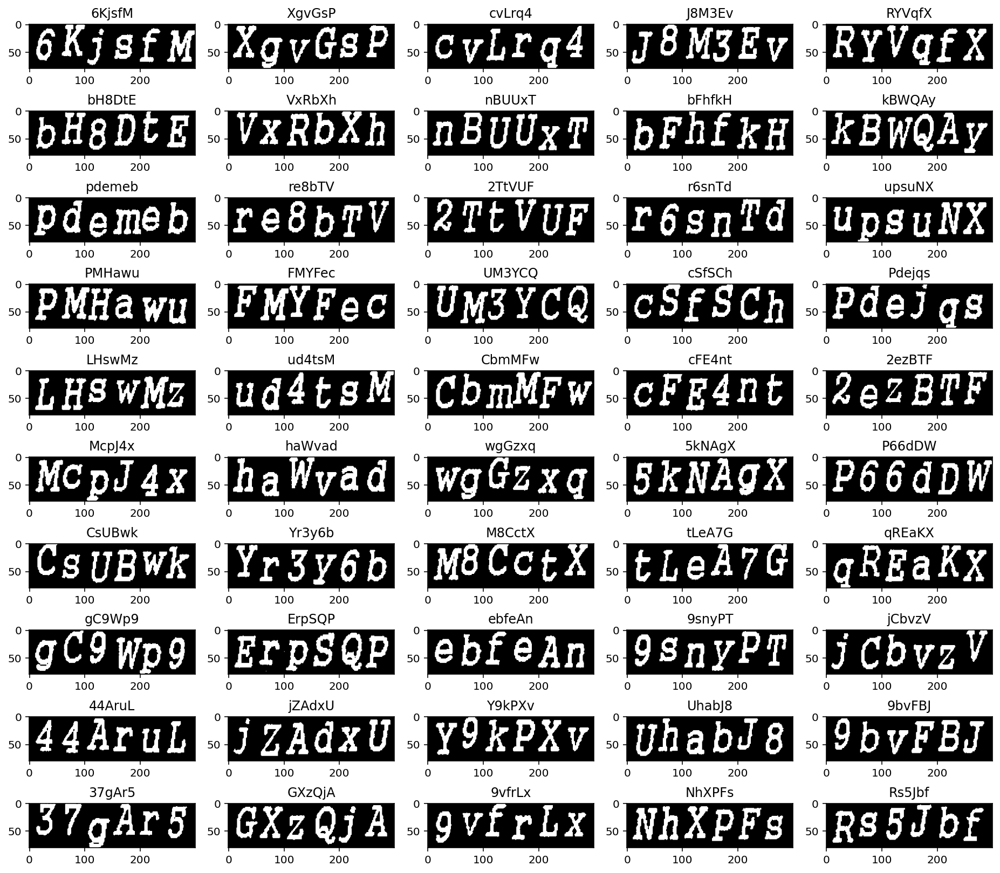

In [11]:
def img_preprocess(img: 'numpy.array', thres: int = 150) -> 'numpy.array':
    img = img[5: -5, 5: -5]
    img = cv2.resize(img, (width,height))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    _, img = cv2.threshold(img, thres, 255, cv2.THRESH_BINARY_INV)
    return img

def encode(texts: list) -> 'numpy.array':
    y = [np.zeros((len(texts), n_class), dtype=np.uint8) for i in range(n_len)]
    for i in range(len(texts)):
        for j, char in enumerate(texts[i]):
            y[j][i, :] = 0
            y[j][i, characters.find(char)] = 1
    return y

test_x = np.array([img_preprocess(img) for img in imgs])
test_y = encode(texts)

fig = plt.figure(figsize=(16, 16))
for index, (text, img) in enumerate(zip(texts, test_x)):
    plt.subplot(len(imgs) // 5 + 1, 5, index + 1)
    plt.imshow(img, cmap='gray')
    plt.title(decode([no_char[index:index+1] for no_char in test_y]))

In [13]:
history = model.fit_generator(generator = gen(), 
                    steps_per_epoch = 10,
                    epochs = 1, 
                    workers = 2,
                    use_multiprocessing = True,
                    validation_data = (test_x ,test_y))

10/10 [==============================] - 76s 8s/step - loss: 75.2515 - c1_loss: 12.2810 - c2_loss: 13.2377 - c3_loss: 13.8362 - c4_loss: 11.1001 - c5_loss: 12.4251 - c6_loss: 12.3713 - c1_accuracy: 0.0344 - c2_accuracy: 0.0250 - c3_accuracy: 0.0188 - c4_accuracy: 0.0125 - c5_accuracy: 0.0188 - c6_accuracy: 0.0344 - val_loss: 2173.5823 - val_c1_loss: 379.2696 - val_c2_loss: 390.3263 - val_c3_loss: 398.4687 - val_c4_loss: 345.5911 - val_c5_loss: 347.0077 - val_c6_loss: 312.9190 - val_c1_accuracy: 0.0200 - val_c2_accuracy: 0.0000e+00 - val_c3_accuracy: 0.0200 - val_c4_accuracy: 0.0000e+00 - val_c5_accuracy: 0.0000e+00 - val_c6_accuracy: 0.0200


In [14]:
model.save('./model.h5')

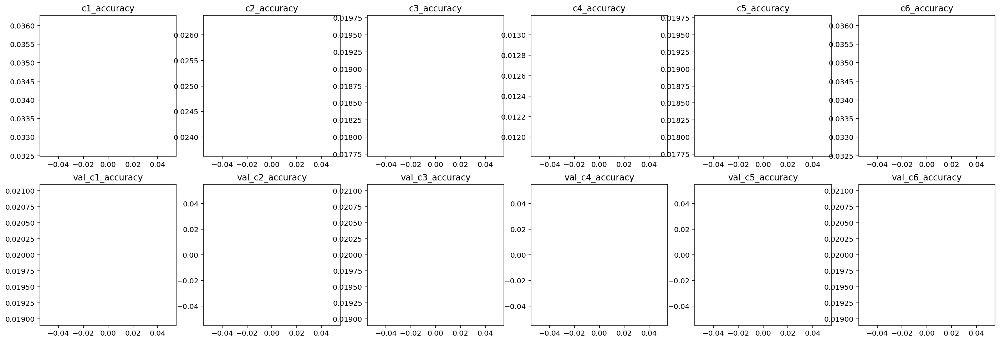

In [16]:
# history.history['val_c6_loss']

fig = plt.figure(figsize = (24, 8))
n_epoch = len(history.history['c1_accuracy'])

epoches = [i for i in range(n_epoch)]
for i in range(0, 6):
    # train
    plt.subplot(2, 6, i + 1)
    quantity = 'c{}_accuracy'.format(i + 1)
    accuracy = history.history[quantity]
    
    plt.plot(epoches, accuracy, color='orange')
    plt.title(quantity)
    
    # test
    plt.subplot(2, 6, i + 7)
    quantity = 'val_c{}_accuracy'.format(i + 1)
    accuracy = history.history[quantity]
    
    plt.plot(epoches, accuracy, color='blue')
    plt.title(quantity)

In [17]:
import json

path = './history.json'
with open(path, 'w') as file:
    json.dump(history.history, file)

# Test

In [19]:
import keras
model = keras.models.load_model('./model.h5')

In [20]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 80, 300, 1)] 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 80, 300, 32)  320         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 80, 300, 32)  9248        conv2d[0][0]                     
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 80, 300, 32)  128         conv2d_1[0][0]                   
______________________________________________________________________________________________

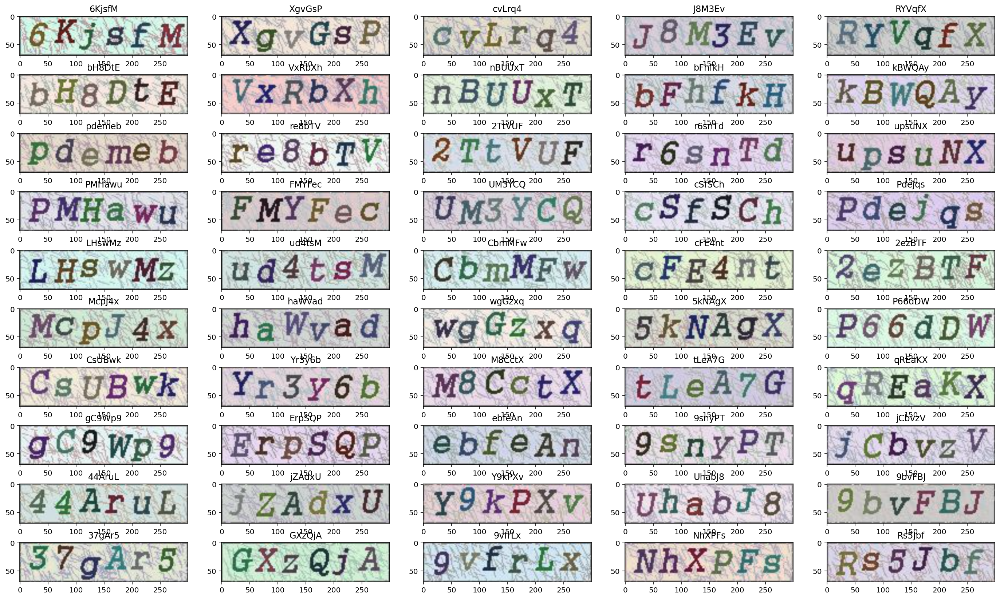

In [21]:
import glob, cv2
import matplotlib.pyplot as plt

img_paths = glob.glob(os.path.join(cur_path, 'captcha-testset/*.png'))

texts, imgs = [], []
for path in img_paths:
    text = path.split('/')[-1].replace('.png','')
    img = cv2.imread(path)
    
    texts.append(text)
    imgs.append(img)
    
fig = plt.figure(figsize=(24, 16))
for index, (text, img) in enumerate(zip(texts, imgs)):
    plt.subplot(len(imgs) // 5 + 1, 5, index + 1)
    plt.imshow(img)
    plt.title(text)

In [22]:
def img_preprocess(img: 'numpy.array', thres: int = 150) -> 'numpy.array':
    img = img[5: -5, 5: -5]
    img = cv2.resize(img, (width,height))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    _, img = cv2.threshold(img, thres, 255, cv2.THRESH_BINARY_INV)
    return img

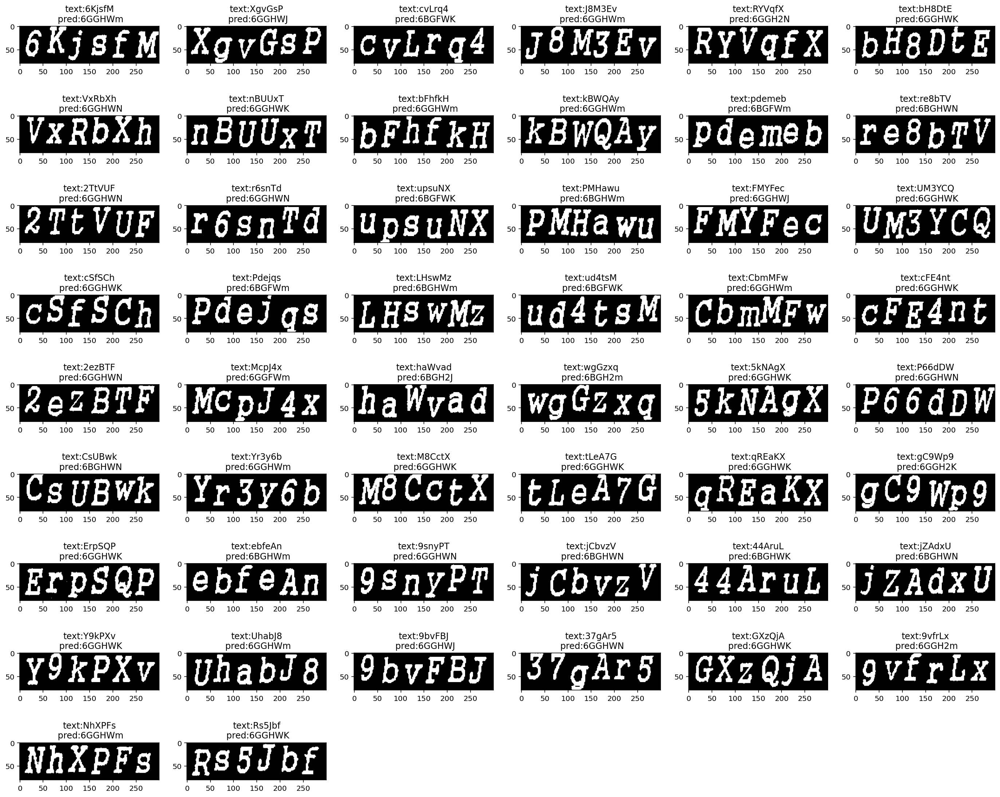

In [23]:
fig = plt.figure(figsize = (24, 20))

for index, (text, img) in enumerate(zip(texts, imgs)):
    x = img_preprocess(img)
    x = x.reshape((1,) + x.shape)
    pred = model.predict(x)
    
    plt.subplot(len(imgs) // 6 + 1, 6, index + 1)
    plt.imshow(x[0], cmap='gray')
    plt.title('text:{}\n pred:{}'.format(text, decode(pred)))